In [24]:
import netCDF4 as nc
from metpy.plots import USCOUNTIES
import metpy
import cartopy.crs as ccrs 
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import wrf
from wrf import vinterp, to_np, getvar, CoordPair, vertcross, get_cartopy, latlon_coords
import pandas as pd
import matplotlib.ticker as ticker
import os
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import TwoSlopeNorm

In [29]:
def new_wrf_cross_theta_perturbationZ(ncfile, ncfile2):
    ncfile = nc.Dataset(ncfile)
    z = getvar(ncfile, 'z', units='m')
    p = getvar(ncfile, "pressure")
    wa = getvar(ncfile, 'wa', units='m/s')
    theta = getvar(ncfile, "theta", units="K")
    time = wrf.extract_times(ncfile, timeidx=0)
    time = pd.to_datetime(str(time))
    ref = ncfile.variables["REFL_10CM"]
    ref = ref[0, 0, :, :]  
    ref = np.where(ref < 1, np.nan, ref)

    ncfile2 = nc.Dataset(ncfile2)
    theta2 = getvar(ncfile2, "theta", units="K")
    avg_theta2 = np.mean(theta2, axis=(1, 2))

    thetae_perturbation = theta - avg_theta2

    start_point = CoordPair(lat=46, lon=-90)
    end_point = CoordPair(lat=44.75, lon=-84.5)
    
    theta_cross = vertcross(thetae_perturbation, z, wrfin=ncfile, start_point=start_point,
                    end_point=end_point, latlon=True, meta=True)
    
    wa_cross = vertcross(wa, z, wrfin=ncfile, start_point=start_point, end_point=end_point, latlon=True, meta=True)

    coord_pairs = to_np(theta_cross.coords["xy_loc"])

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

    theta_contours = ax1.contourf(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),
                                    to_np(theta_cross),cmap='coolwarm',levels=np.arange(-6,6.1,.5), extend='both')
    cb_theta = fig.colorbar(theta_contours, ax=ax1, label='Kelvins')

    theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),
                                to_np(theta_cross),colors='black',linestlyes='solid',levels=np.arange(-6,6.1,.5))

    ax1.clabel(theta_contours, inline=1, fontsize=12, fmt="%.1f")

    ax1.set_title("Potential Temperature Perturbation", fontsize=12)
    ax1.set_ylim(0, 7000)

    wa_contours = ax2.contourf(np.arange(coord_pairs.shape[0]),to_np(wa_cross["vertical"]),to_np(wa_cross),
                            cmap='PiYG', levels=np.arange(-3, 3.1, 0.5), extend='both')
    cb_wa = fig.colorbar(wa_contours, ax=ax2, label='m/s')

    wa_contour = ax2.contour(np.arange(coord_pairs.shape[0]), to_np(wa_cross["vertical"]), to_np(wa_cross), 
                            colors='black', levels=[-3, -2.5, -2, -1.5, -1, 1, 1.5, 2, 2.5, 3])

    ax2.clabel(wa_contour, inline=1, fontsize=12, fmt="%.1f")

    ax2.set_title("Vertical Velocity", fontsize=12)
    ax2.set_ylim(0, 7000)

    for ax in [ax1, ax2]:
        ax.grid(axis='y', linestyle='-', linewidth=0.5, color='black')
        ax.set_ylabel('Altitude (m)')
        ax.set_xlabel('Latitude/Longitude')
        x_labels = []
        x_ticks = np.arange(coord_pairs.shape[0])
        for pair in to_np(coord_pairs):
            lat, lon = pair.latlon_str().split(',')
            formatted_lat = '{:.2f}'.format(float(lat))
            formatted_lon = '{:.2f}'.format(float(lon))
            x_labels.append(formatted_lat + ', ' + formatted_lon)
        ax.set_xticks(x_ticks[::20])
        ax.set_xticklabels(x_labels[::20], rotation=45, fontsize=8)

    plt.suptitle('WRF Potential Temperature Perturbation (K) and Vertical Velocity (m/s) Cross-Section {} UTC'.format(time.strftime("%Y-%m-%d %H:%M")), fontsize=16)
    plt.tight_layout()
    #plt.savefig("WRF_UVV_{}".format(time.strftime("%Y-%m-%d-%H_%M")),dpi=450, bbox_inches='tight')
    plt.show()

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


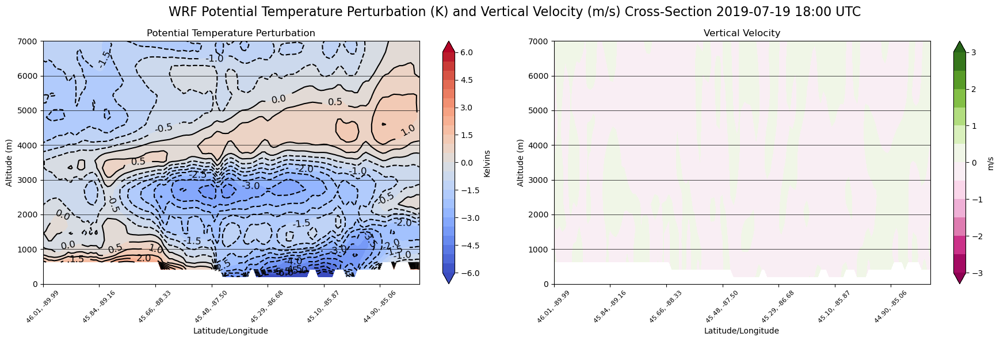

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


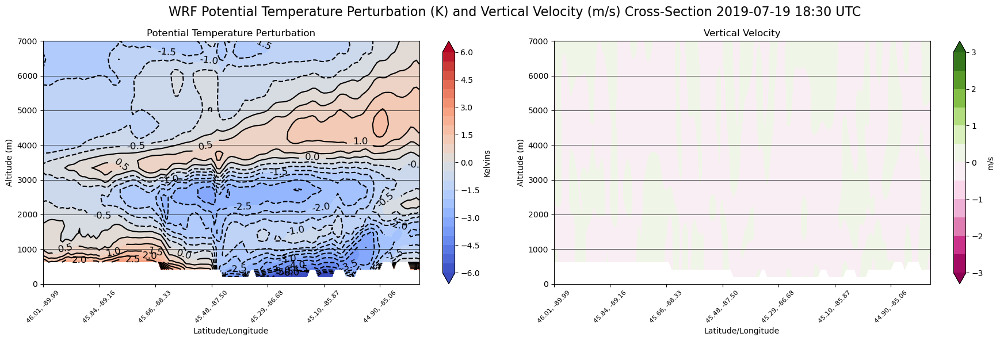

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


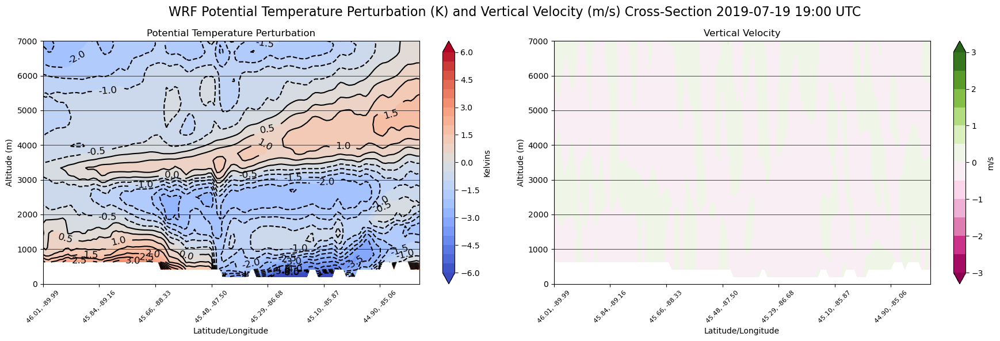

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


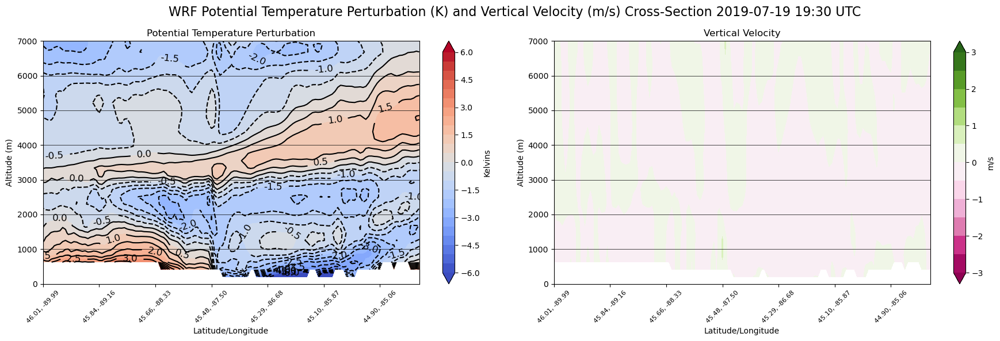

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


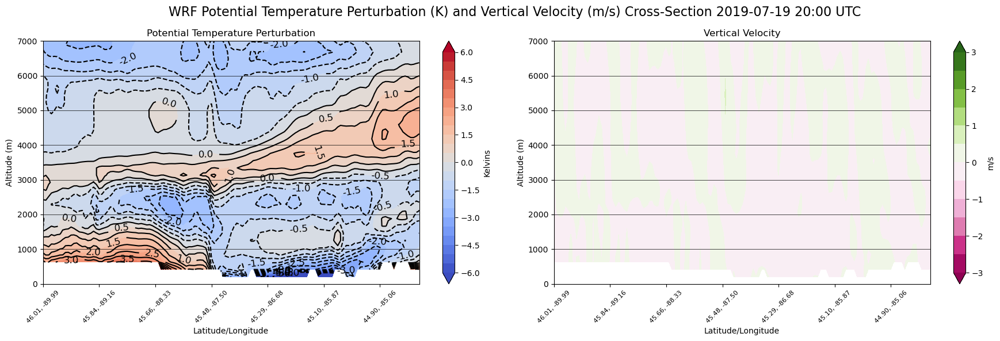

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


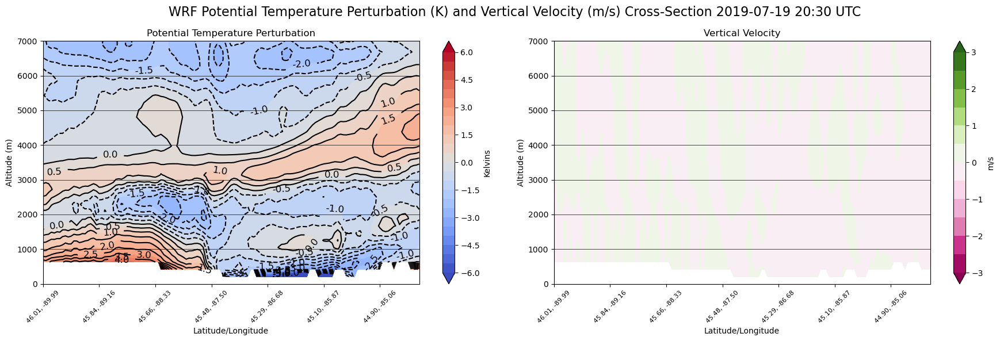

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


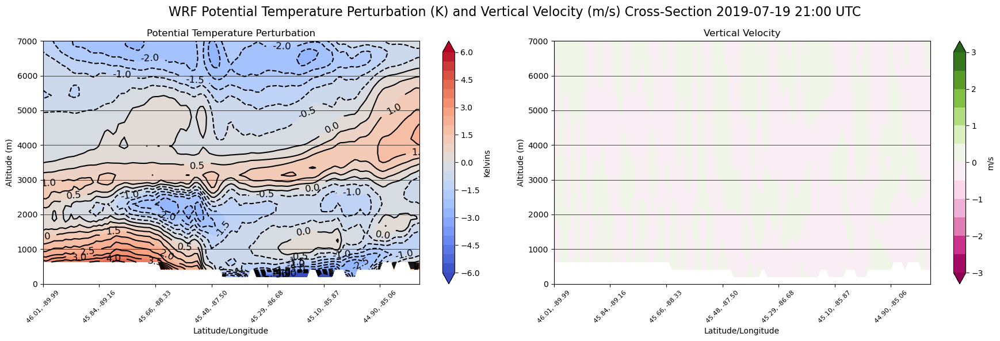

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


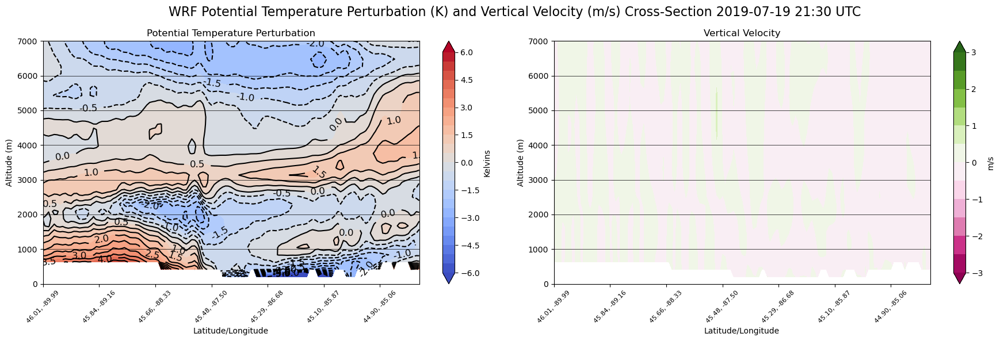

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


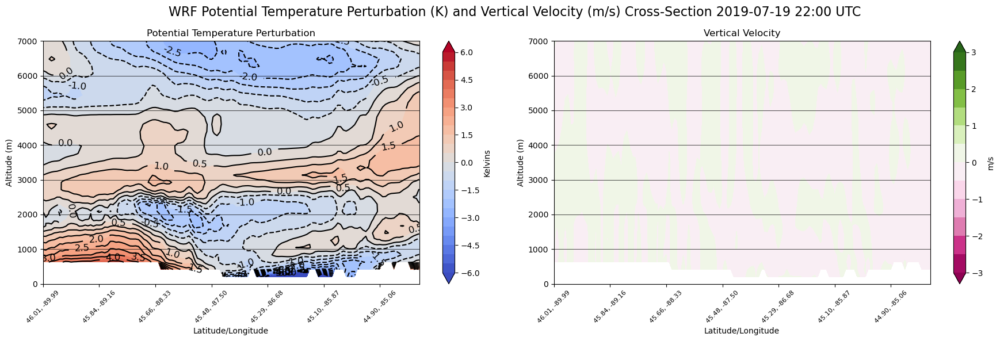

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


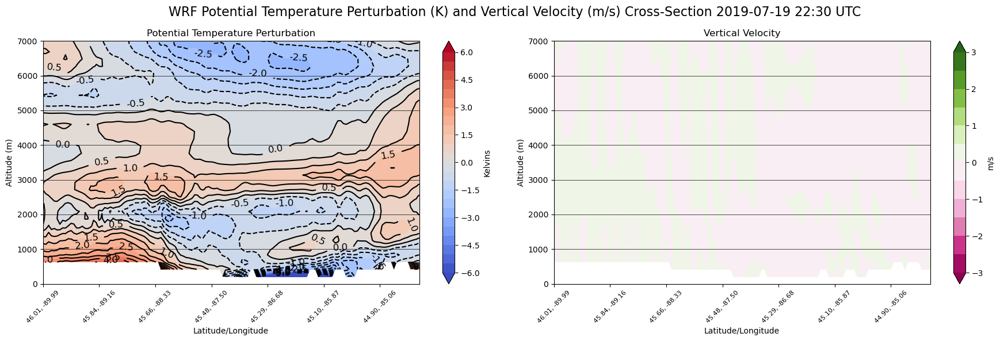

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


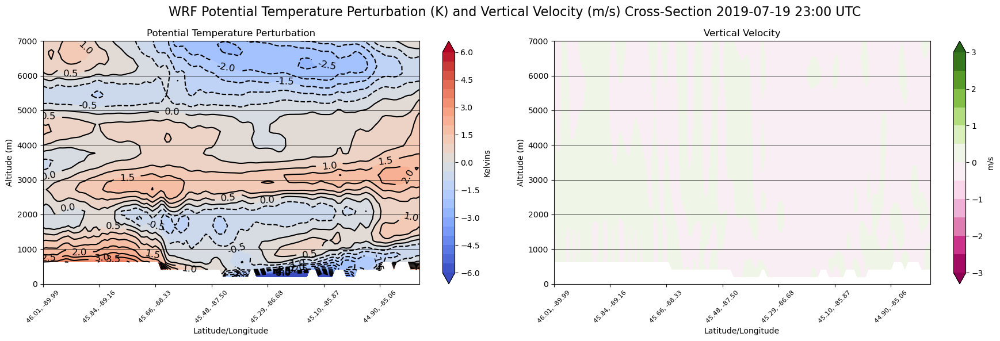

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


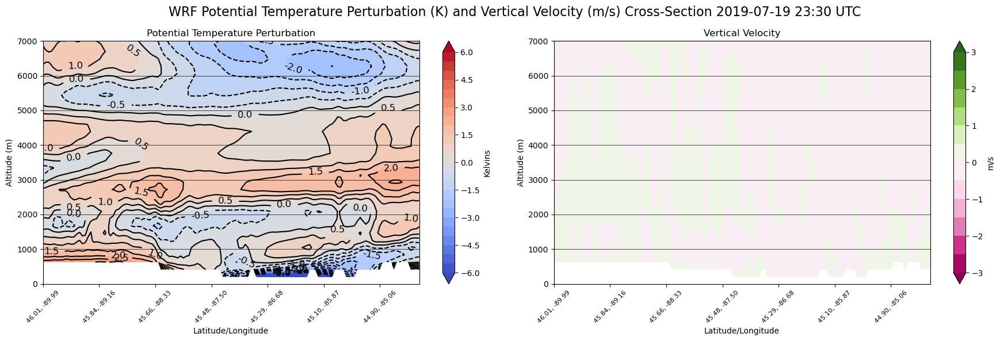

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


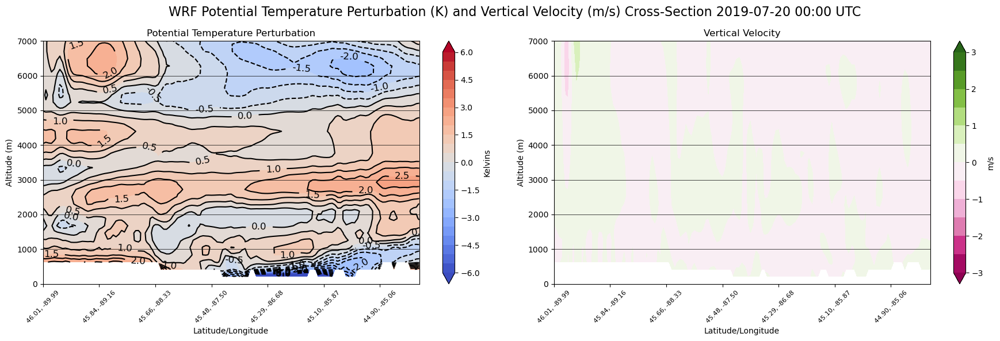

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


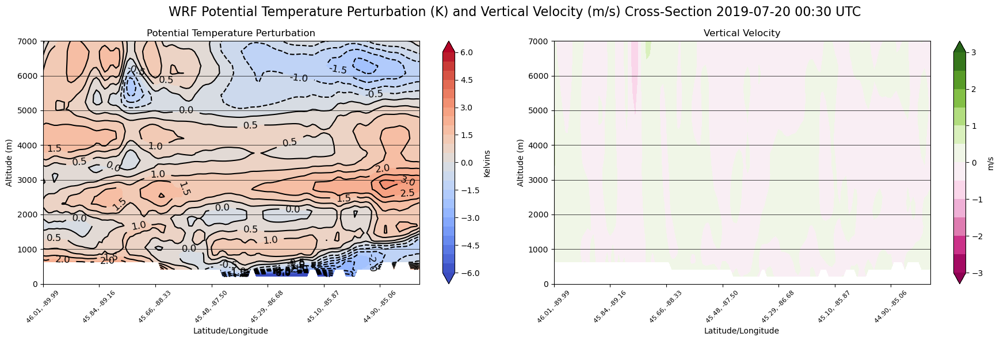

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


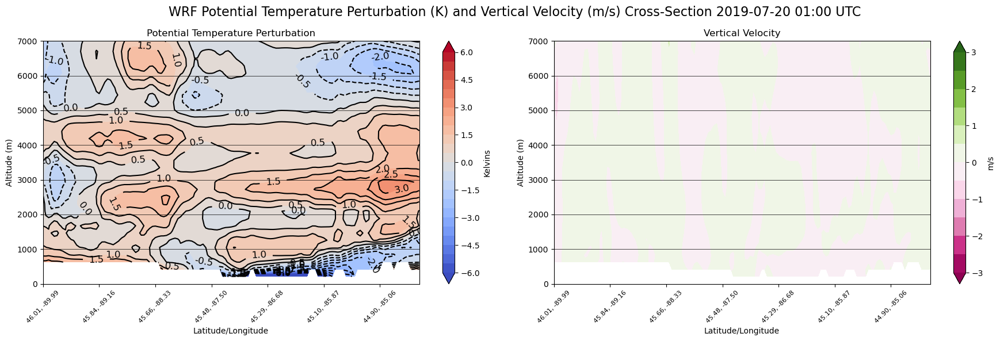

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


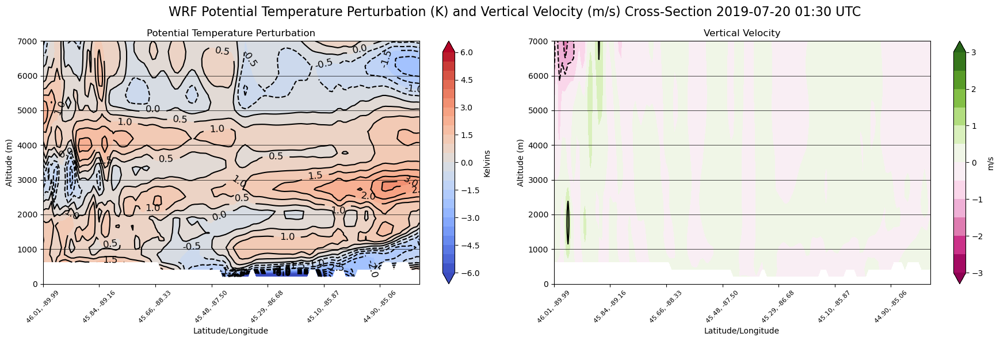

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


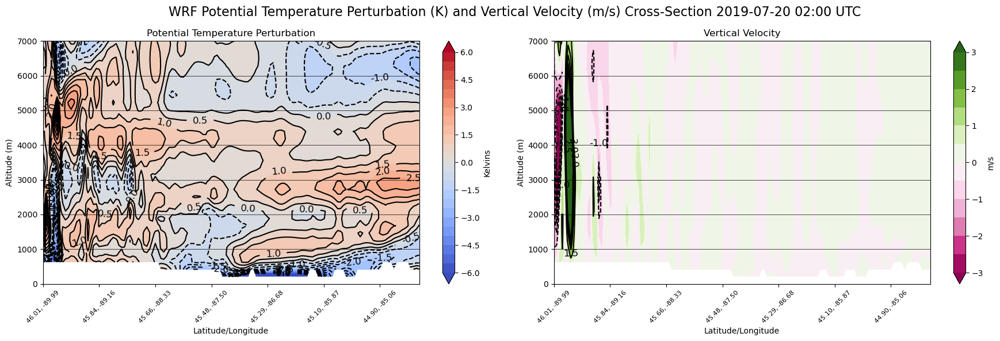

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


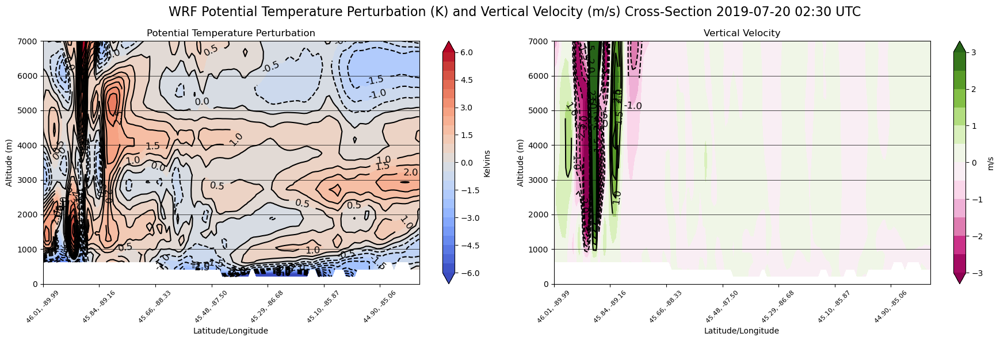

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


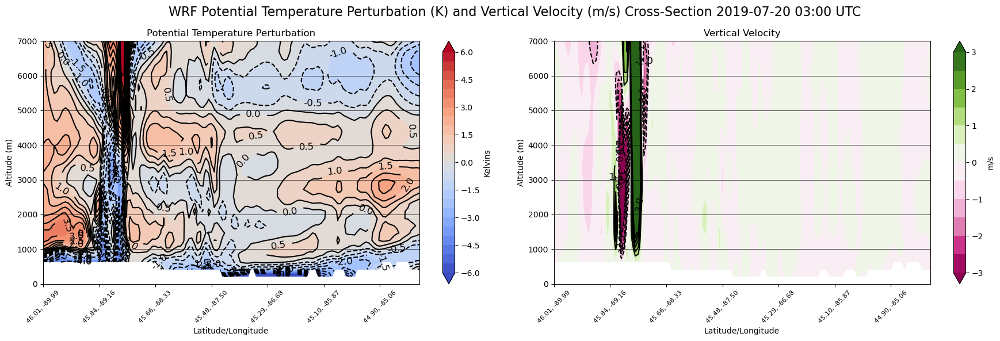

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


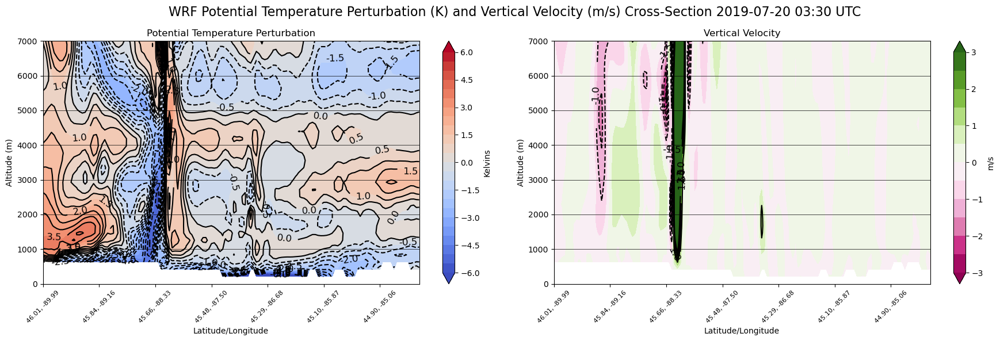

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


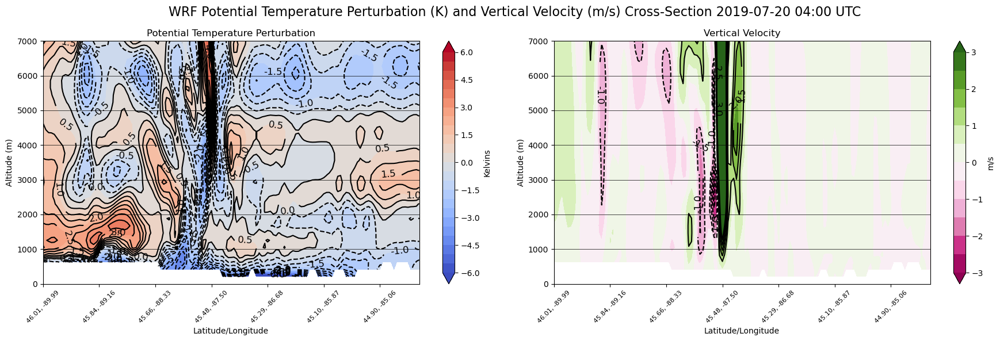

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


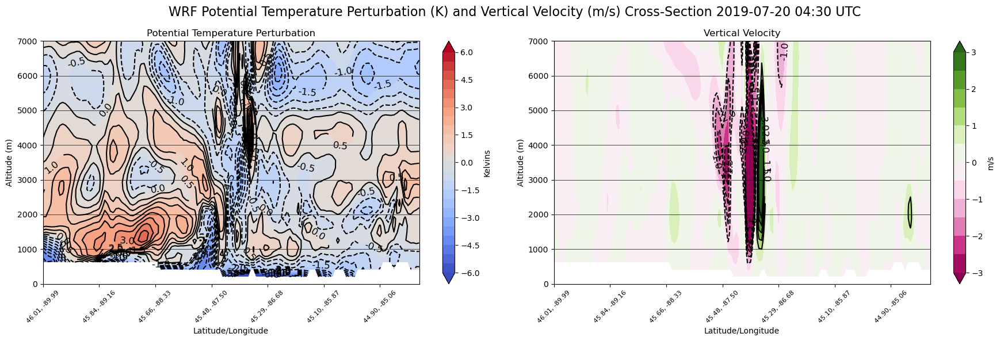

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


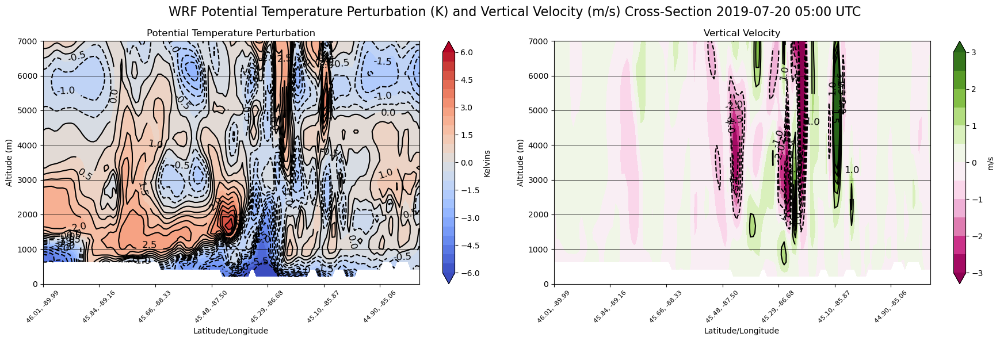

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


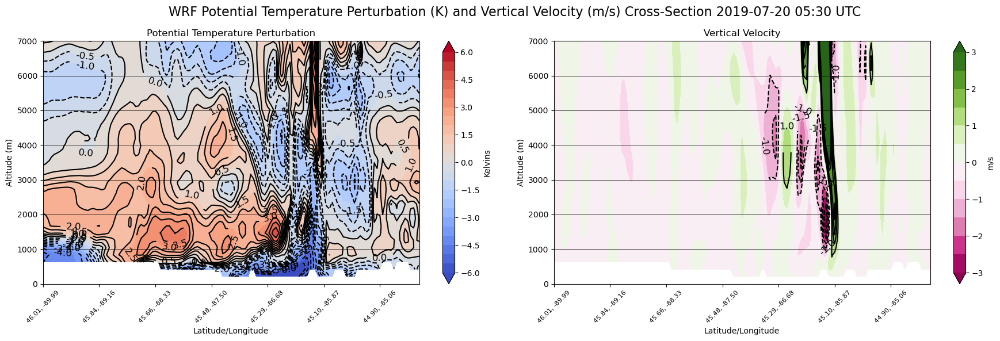

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


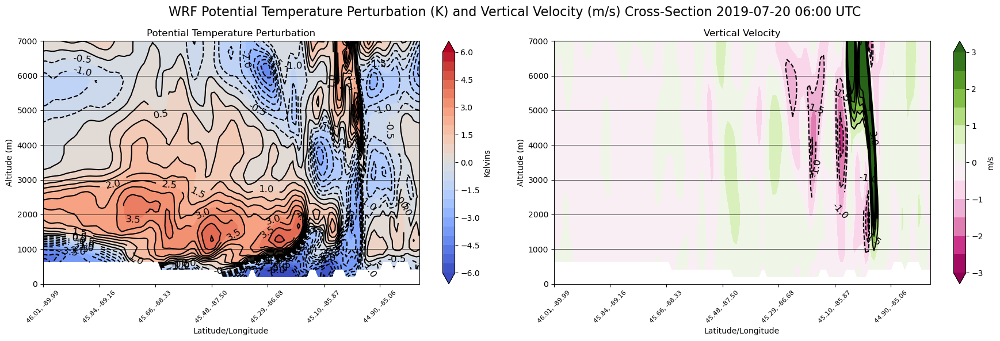

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


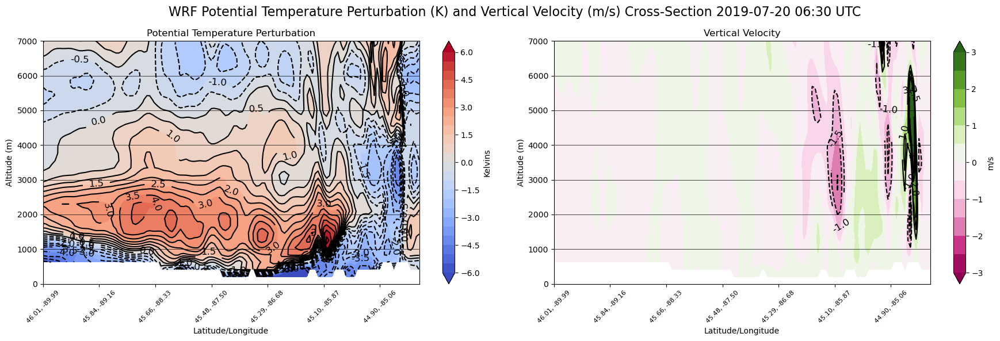

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


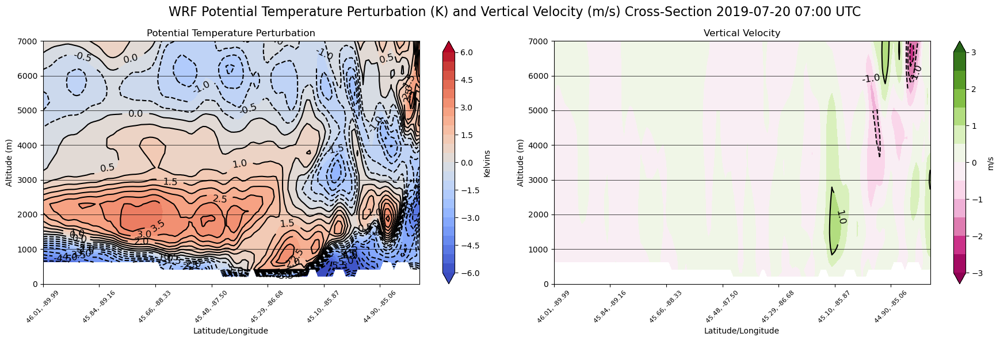

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


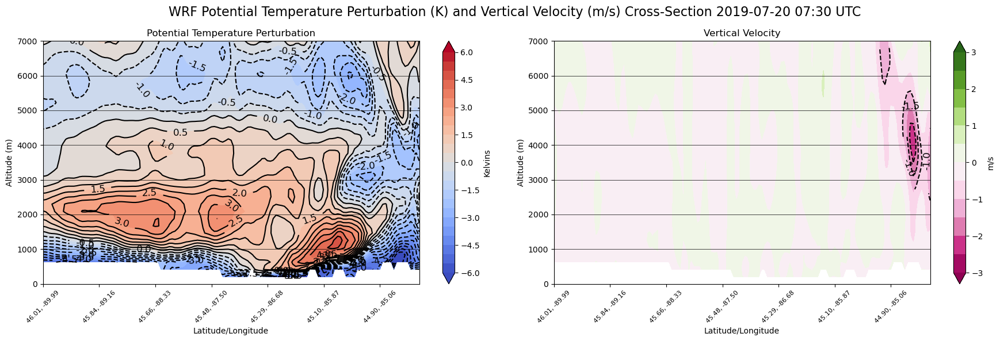

C:\Users\Tony\AppData\Local\Temp\ipykernel_26380\744116117.py:36: UserWarning: The following kwargs were not used by contour: 'linestlyes'
  theta_contours = ax1.contour(np.arange(coord_pairs.shape[0]),to_np(theta_cross["vertical"]),


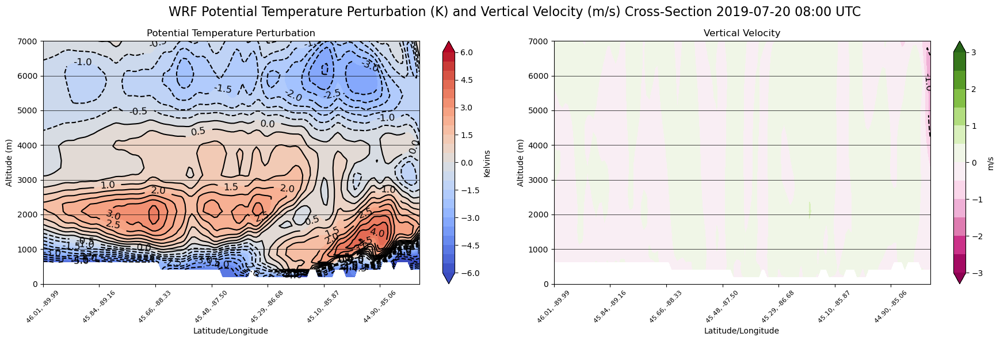

In [30]:
directory = 'c:\\Users\\Tony\\Desktop\\wrfoutput\\lots of levels'
pre_conv = "C:\\Users\\Tony\\Desktop\\wrfoutput\\lots of levels\\wrfout_d02_2019-07-20_00_00_00"
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)
    new_wrf_cross_theta_perturbationZ(file_path, pre_conv)